# TP3 - Make your own Similar Image Search Engine (SISE)

The objective of this TP is two-fold:

- demonstrate that trained neural networks yield **excellent features/representations**,
- get familiar with the concept of **transfer learning**, where the knowledge of a model trained on dataset **A** is leveraged for downstream tasks on an unseen dataset **B**.

To do so, we are going to exploit the features of a model pretrained on the classification [ImageNet dataset](https://image-net.org/) (dataset **A**), a largescale dataset of 1k classes and 1M samples. We will show that such a model has learned general features that can be re-used for other tasks and datasets. In particular in this TP, we will build our own **Similar Image Search Engine (SISE)** which is defined as a system taking as input an image and outputs the *K* most similar images in the database, The most popular SISE is the powerful *Google image search* which you can try at [https://www.google.com/imghp?](https://www.google.com/imghp?). For memory/computational reasons, we will use the small [Caltech101 dataset](http://www.vision.caltech.edu/Image_Datasets/Caltech101/) (dataset **B**) as our reference database. Transfer learning is especially important since it has been shown to (i) generalize well to unseen target datasets and (ii) stabilize and fasten training on more complex tasks.

Check you are running the notebook on a GPU:

In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
import torch

USE_GPU = True
dtype = torch.float32 # we will be using float throughout this tutorial
device = torch.device('cuda') if (USE_GPU and torch.cuda.is_available()) else torch.device('cpu')
print('using device:', device)

using device: cuda


## A. Naive implementation

In this part, we implement a naive SISE algorithm. We will first explore and prepare our dataset and then use the classical L2-distance in pixel space to compute similarity between images.

### A.1. Explore and prepare Caltech101 dataset

The target dataset is [Caltech101](http://www.vision.caltech.edu/Image_Datasets/Caltech101/), a 8k image classification dataset of 101 classes. The package `torchvision` allows to easily download, and read the data.

In [2]:
from torchvision.datasets import Caltech101
import torchvision.transforms as T

class ToRGB:
    def __call__(self, image):
        return image.convert('RGB')

tsf = T.Compose([ToRGB(), T.Resize((224, 224))])

raw_dataset = Caltech101(root='./data', transform=tsf, download=False)
class_mapping = raw_dataset.categories

**Q1.a.** Explore the dataset by (i) printing the dataset size and the image size, and (ii) vizualizing 25 random images with their associated classes as titles. You should use previous ```class_mapping``` dictionary to show real class labels.

Size of the dataset: 8677. Size of an image: (224, 224)


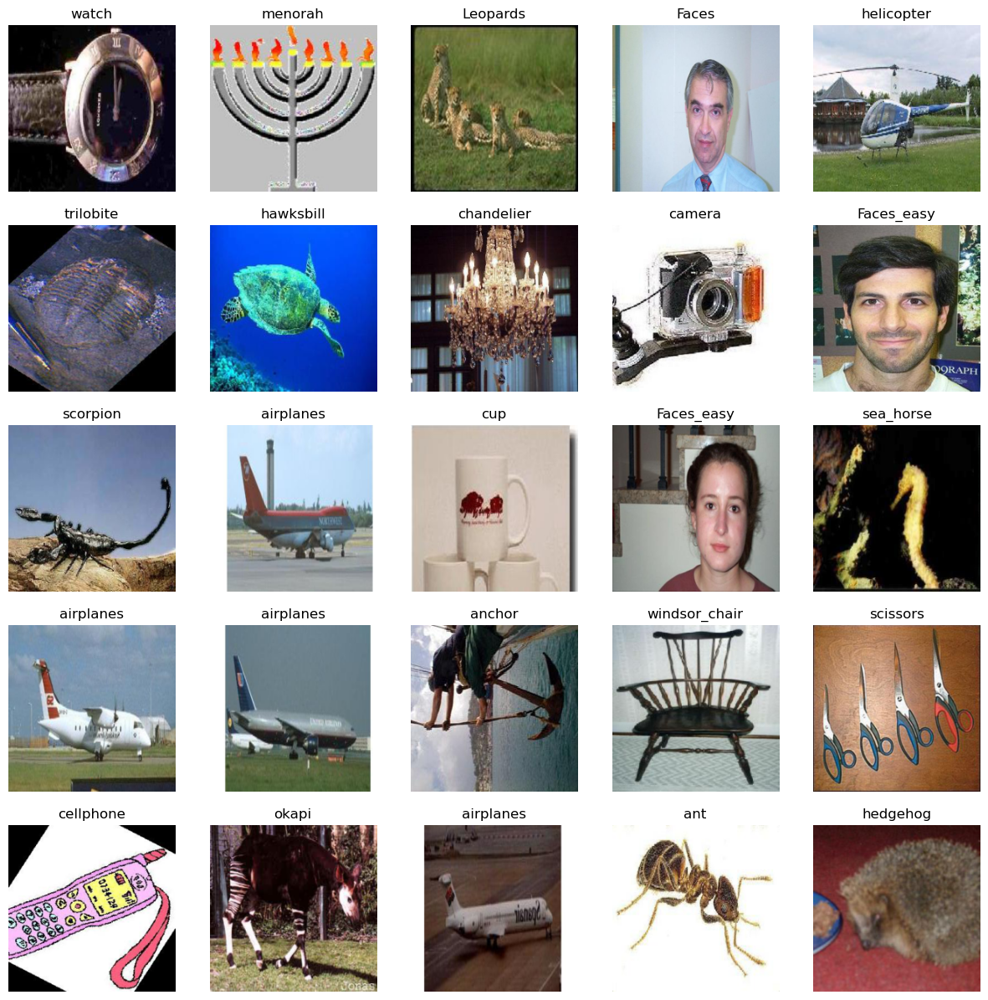

In [3]:
### Your code ###
print(f"Size of the dataset: {len(raw_dataset)}. Size of an image: {raw_dataset[0][0].size}")
fig, ax = plt.subplots(5, 5, figsize=(15, 15))
for i,k in enumerate(np.random.choice(len(raw_dataset), 25)):
    img, label = raw_dataset[k]
    class_name = class_mapping[label]
    ax[i//5][i%5].imshow(img)
    ax[i//5][i%5].set_title(class_name)
    ax[i//5][i%5].axis('off')

**Q1.b.** As always we need to normalize data, the following cell instanciates a new dataset that is normalized with precomputed mean and std, as well a Dataloader of batch_size 128. Explain in a few words why we need to normalize data:

**Your answer:** Normalization prevents some features from dominating the training process just by their scale, it also helps to make the model more general to unseen data

In [4]:
import torchvision.transforms as T
from torch.utils.data import DataLoader

tsf = T.Compose([ToRGB(), T.Resize((224, 224)), T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
proc_dataset = Caltech101(root='./data/', transform=tsf, download=True)

batch_size = 128
loader = DataLoader(proc_dataset, batch_size=batch_size, shuffle=False)

Files already downloaded and verified


*NB:* note that we resize images to match the image size used to train the model on ImageNet

### A.2. Pixel-based similarity

**Q2.a.** Complete the function `show_images(indices)` which takes as input a list of indices `indices` and plot the corresponding images in the unnormalized dataset `raw_dataset`, titled with their real class label.

In [5]:
def show_images(indices):
    
    size = len(indices)
    fig = plt.figure(figsize=(25,25))
    for i,k in enumerate(indices):
        a=fig.add_subplot(1,size,i+1)
        img, label = raw_dataset[k]
        class_name = class_mapping[label]
        a.imshow(img)
        a.set_title(class_name)
        a.axis('off')

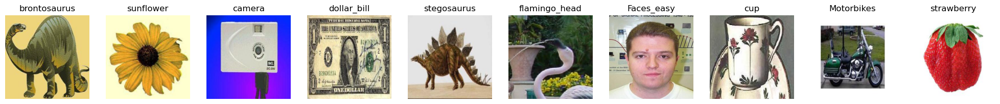

In [8]:
# Test function
show_images(np.random.choice(8000, 10, replace=False))

**Q2.b.** Complete the function `mse(img, others)` which takes as input an image `img` (tensor of size *CxHxW*), a list of images `others` (tensor of size *BxCxHxW*), and outputs the Mean Square Error (MSE) between `img` and each element in others.

*NB:* don't forget to put the tensors on the cuda `device` to benefit from accelerated computations.

In [6]:
def mse(img, others):
    img = img.to(device=device)
    others = others.to(device=device)
    return (torch.sub(others,img)**2).flatten(1).mean(1)

In [84]:
# Test function
assert mse(torch.rand(3, 64, 64), torch.rand(10, 3, 64, 64)).shape == torch.zeros(10).shape

**Q2.c.** Complete the function `naive_retrieve_similar(img, dataset, K)` which takes as input an tensor image `img`, a pytorch dataloader `loader`, an integer `K`, and outputs the indices of the *K* most similar images where the similarity is defined by the squared L2-distance implemented above.

In [7]:
def naive_retrieve_similar(img, loader, K=10):
    min_idx, min_dist = torch.zeros(K,device=device), 10e6*torch.ones(K,device=device)     # We initialize with dummy elements the indices yielding the minimal distance and corresponding distances
    for batch, (inp, label) in enumerate(loader):

        dist = mse(img,inp)
        batch_size = inp.size(0)
        
        # Combining distances and indices of the current batch with existing minimum distances and indices
        combined_dist = torch.cat((min_dist, dist), dim=0)
        combined_idx = torch.cat((min_idx, torch.arange(batch_size,device=device) + batch * loader.batch_size), dim=0)
        
        # Sorting to find the indices of the K smallest distances
        _, indices = torch.topk(combined_dist, k=K, largest=False)
        
        # Updating the minimum distances and indices
        min_dist = combined_dist[indices]
        min_idx = combined_idx[indices]
    
    return min_idx.to(dtype=int)

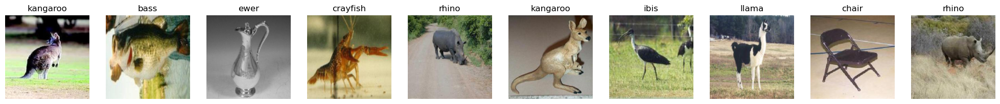

In [85]:
# Single test
show_images(naive_retrieve_similar(proc_dataset[5818][0], loader))

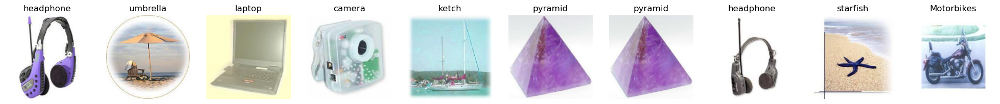

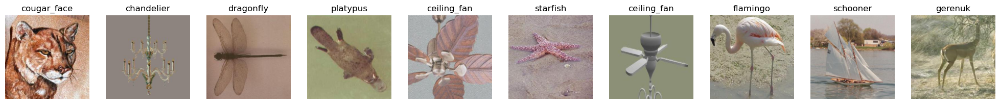

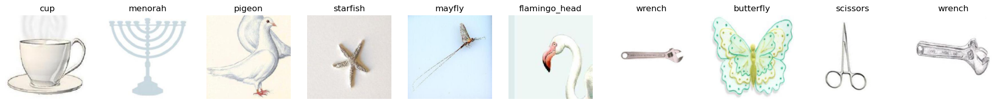

In [86]:
# Test function (should take less than 5 minutes)
show_images(naive_retrieve_similar(proc_dataset[5464][0], loader))
show_images(naive_retrieve_similar(proc_dataset[4037][0], loader))
show_images(naive_retrieve_similar(proc_dataset[4283][0], loader))

**Q2.d.** Briefly analyse and comments your results.

**Your answer:** The naive method for image retrieval seams to capture similarities of color between the images, as can be seen by the last two tests which are highly uniform in color. In the case of the first example, it appears to have captured the presence of a central figure which is distinguished from the background. In any case, however, this method did not capture the similarity between images that belong to the same class.

## B. Leveraging a pretrained NN

In this part, we will use a pytorch model pretrained on ImageNet and available through the ```torchvision``` package (more info [here]((https://pytorch.org/vision/stable/models.html)). These models have been trained on GPUs for several days/weeks with carefully selected hyperparameters to produce the best results. We chose to work with a [ResNet-18](https://arxiv.org/abs/1512.03385) architecture which has the advantage to give decent results on ImageNet (69.7% accuracy) and to be relatively small in terms of GPU memory.

### B.1. Load and prepare network

**Q3.a.** Load a pretrained ResNet-18 model using ``torchvision`` (see doc at https://pytorch.org/vision/stable/models.html), put it in evaluation mode (see [here](https://stackoverflow.com/questions/60018578/what-does-model-eval-do-in-pytorch) for more info) and move it to the cuda `device`:

In [8]:
### Your code ###

from torchvision.models import resnet18, ResNet18_Weights
weights = ResNet18_Weights.DEFAULT
model = resnet18(weights=weights).to(device)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Run the following cell to install a useful library to vizualize the architecture of the model:

In [9]:
!pip install torchsummary
from torchsummary import summary
# Shape of an image is 224x224 with 3 RGB channels
summary(model, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

**Q3.b.** How many parameters are there in the loaded model? How many convolutional layers? What is the number of channels before the final linear layer?

**Your answer :** The model possesses 11,689,512 parameters. There are 20 convolutional layers. Before the final layer there are 512 channels.

**Q3.c.** For a classification network, the last linear layer is called a *classification head*: it maps a vector from a feature space to a vector in the class space. In our case where classes don't necessarily correspond to the classes of the loaded model, we would like to directly use the output feature instead of the classification head output. We do it through the following cell, please read and briefly describe it:

**Your answer:** This code replaces the two last layers of the pre-trained model, avgpool and fc, with the identity operation. This way, we can access the features the model learned with the previous layers.

In [10]:
from torch import nn

class Identity(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return x

model.avgpool = Identity()
model.fc = Identity()

### B.2. Feature-based similarity

**Q4.a.** Complete the function ```nn_retrieve_similar(img, dataset, K)``` which takes as input an tensor image ```img```, a pytorch dataloader ```loader```, and outputs the indices of the K most similar images where the similarity is defined by the MSE in the NN feature space.

In [12]:
def nn_retrieve_similar(img, loader, K=10):
    min_idx, min_dist = torch.zeros(K,device=device), 10e6*torch.ones(K,device=device)     # We initialize with dummy elements the indices yielding the minimal distance and corresponding distances
    img = img.to(device)
    feat_img = model(img.unsqueeze(0))

    with torch.no_grad():
        for batch, (inp, label) in enumerate(loader):
            inp = inp.to(device)
            dist = mse(feat_img,model(inp))
            batch_size = inp.size(0)
            
            # Combining distances and indices of the current batch with existing minimum distances and indices
            combined_dist = torch.cat((min_dist, dist), dim=0)
            combined_idx = torch.cat((min_idx, torch.arange(batch_size,device=device) + batch * loader.batch_size), dim=0)
            
            # Sorting to find the indices of the K smallest distances
            _, indices = torch.topk(combined_dist, k=K, largest=False)
            
            # Updating the minimum distances and indices
            min_dist = combined_dist[indices]
            min_idx = combined_idx[indices]
    
    return min_idx.to(dtype=int)

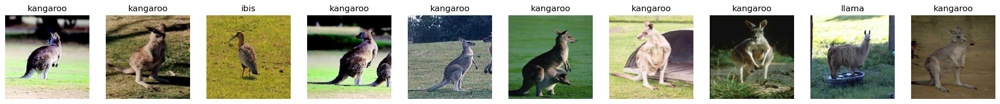

In [93]:
# Single test
show_images(nn_retrieve_similar(proc_dataset[5818][0], loader))

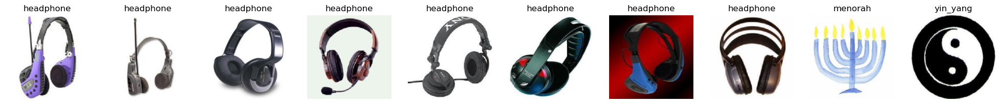

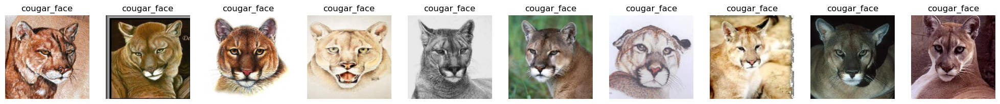

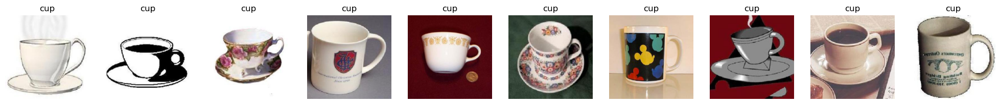

In [94]:
# Test function (should take less than 5 minutes)
show_images(nn_retrieve_similar(proc_dataset[5464][0], loader))
show_images(nn_retrieve_similar(proc_dataset[4037][0], loader))
show_images(nn_retrieve_similar(proc_dataset[4283][0], loader))

**Q4.b.** Analyze and briefly comment your results.

**Your answer:** Using the resnet18 model we see a great improvement in the results. For each of the images searched, most of the results now belong to the same class. In the case of the Kangaroo photo, we also get pictures of other animals (ibis and llama), but they are in a similar landscape so it is still a very good result.

**Q5.a.** It exists many distances to compare vectors in high dimensional space. One distance commonly used to compare NN features is the [cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity). Implement a new function `nn_retrieve_similar_cos(img, dataset, K)` which uses the cosine similarity instead of L2-distance:

In [13]:
def nn_retrieve_similar_cos(img, dataset, K=10):
    min_idx, max_sim = torch.zeros(K,device=device), -1*torch.ones(K,device=device)     # We initialize with dummy elements the indices yielding the max similarity and corresponding distances
    img = img.to(device)
    feat_img = model(img.unsqueeze(0))
    cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    with torch.no_grad():
        for batch, (inp, label) in enumerate(loader):
            inp = inp.to(device)
            dist = cos(feat_img,model(inp))
            batch_size = inp.size(0)
            
            # Combining distances and indices of the current batch with existing max similarities and indices
            combined_dist = torch.cat((max_sim, dist), dim=0)
            combined_idx = torch.cat((min_idx, torch.arange(batch_size,device=device) + batch * loader.batch_size), dim=0)
            
            # Sorting to find the indices of the K largest similarities
            _, indices = torch.topk(combined_dist, k=K, largest=True)
            
            # Updating the max sim and indices
            max_sim = combined_dist[indices]
            min_idx = combined_idx[indices]
    
    return min_idx.to(dtype=int)

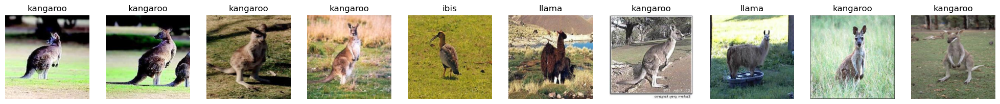

In [115]:
# Single test
show_images(nn_retrieve_similar_cos(proc_dataset[5818][0], loader))

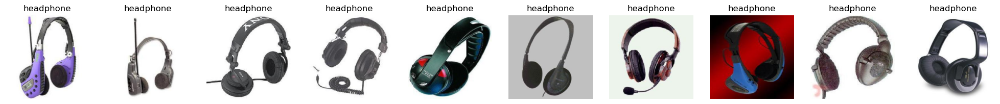

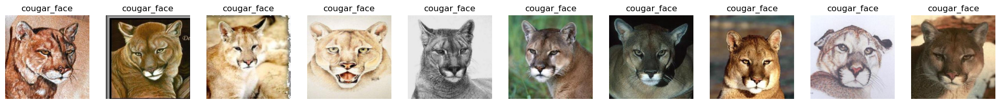

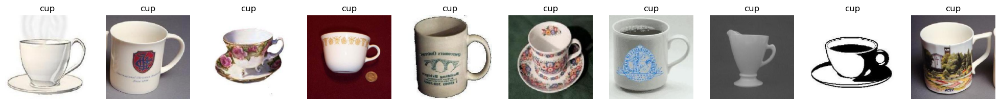

In [111]:
# Test function (may take a few minutes, you may want to try other samples)
show_images(nn_retrieve_similar_cos(proc_dataset[5464][0], loader))
show_images(nn_retrieve_similar_cos(proc_dataset[4037][0], loader))
show_images(nn_retrieve_similar_cos(proc_dataset[4283][0], loader))

**Q5.b.** Analyze and briefly comment your results.

**Your answer:** Using the cosine similarity we reached improved results, with the headphone search now only presenting pictures of the same class and the kangaroo search ranking a very similar image as the best result (the ibis result also ranked a bit lower than before). However, this method took about double the time to run compared to the L2 distance.

## C. Going further (bonus if no time)

A limited number of points will be attributed for the following questions.

**Q6.a.** Propose a metric to quantitatively evaluate our SISE.

**Your answer:** A possible metric could be the precision of the retrieval, that is, the proportion of images retrieved that belong to the same class as the query image.

**Q6.b.** Implement it and evaluate your best SISE.

In [14]:
### Your code ###
def eval_result(img_id,img_list):
    score=0
    for id in img_list:
        if raw_dataset[img_id][1] == raw_dataset[id][1]:
            score+=1
    
    return score/len(img_list)

In [129]:
img_id = 5818
print("Result naive: ",eval_result(img_id,naive_retrieve_similar(proc_dataset[img_id][0], loader,K=20)))
print("Result MSE: ",eval_result(img_id,nn_retrieve_similar(proc_dataset[img_id][0], loader,K=20)))
print("Result cos: ",eval_result(img_id,nn_retrieve_similar_cos(proc_dataset[img_id][0], loader,K=20)))

Result naive:  0.1
Result MSE:  0.55
Result cos:  0.75


According to the proposed metric, the cosine similarity method using resnet's features provides the best results.

**Q7.a.** We arbitrarly used the features obtained before the final pooling and linear layers, which are also known as **conv5 features** as output of the 5th convolutional block. Implement and evaluate a similarity computed on **conv4 feature** by setting the approriate layers to identity.

*NB:* you can retrieve the list of module names with `[n for n, k in model.named_modules()]`

In [15]:
### Your code ###
[n for n, k in model.named_modules()]
model.layer4 = Identity()

In [16]:
def nn_retrieve_similar_cos_conv4(img, dataset, K=10):
    min_idx, max_sim = torch.zeros(K,device=device), -1*torch.ones(K,device=device)     # We initialize with dummy elements the indices yielding the max similarity and corresponding distances
    img = img.to(device)
    feat_img = model(img.unsqueeze(0))
    cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    with torch.no_grad():
        for batch, (inp, label) in enumerate(loader):
            inp = inp.to(device)
            dist = cos(feat_img,model(inp))
            batch_size = inp.size(0)
            
            # Combining distances and indices of the current batch with existing max similarities and indices
            combined_dist = torch.cat((max_sim, dist), dim=0)
            combined_idx = torch.cat((min_idx, torch.arange(batch_size,device=device) + batch * loader.batch_size), dim=0)
            
            # Sorting to find the indices of the K largest similarities
            _, indices = torch.topk(combined_dist, k=K, largest=True)
            
            # Updating the max sim and indices
            max_sim = combined_dist[indices]
            min_idx = combined_idx[indices]
    
    return min_idx.to(dtype=int)

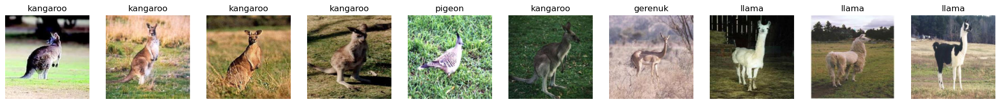

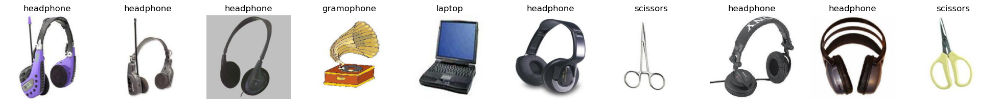

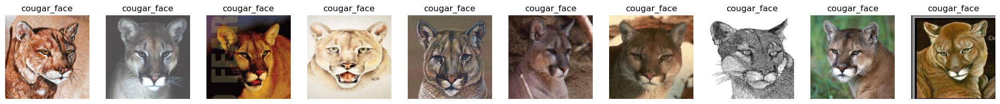

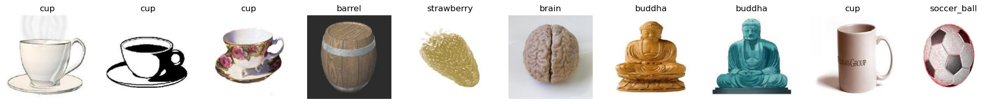

In [17]:
show_images(nn_retrieve_similar_cos_conv4(proc_dataset[5818][0], loader))
show_images(nn_retrieve_similar_cos_conv4(proc_dataset[5464][0], loader))
show_images(nn_retrieve_similar_cos_conv4(proc_dataset[4037][0], loader))
show_images(nn_retrieve_similar_cos_conv4(proc_dataset[4283][0], loader))

In [21]:
print("Result conv4: ",eval_result(img_id,nn_retrieve_similar_cos_conv4(proc_dataset[img_id][0], loader,K=20)))

Result conv4:  0.4


**Q7.b.** Analyze and briefly comment your results.

**Your answer:** By removing the conv5 layer, the quality of the results decreased overall. Other classes are now present in the query for cup and headphone, which was not the case when we used conv5 with the cosine similarity measure. Finally, the model scored 0.4 in our metric, placing it in the penultimate position, but still ahead of the naive approach.